## Idea Generation for Price Prediction Signal for a Macro Asset or ETF

* Objective: Conceptualize a novel price prediction signal for a chosen macro asset or broad-based index
ETF.

  * This project focuses on idea generation, understanding the underlying rationale, and
potential data-driven insights that could back up the proposed signal. While the main emphasis
is on the conceptual framework, implementation or preliminary testing is a valuable addition.

  * Begin by selecting a major macro asset or broad-based index ETF of interest. Based on your
research, conceptualize a potential price prediction signal. This could be rooted in technical
analysis, fundamental analysis, or any unconventional sources or patterns you've identified.
Articulate the reasoning behind your proposed signal. Why do you believe it might have
predictive power? Are there any historical events or data-driven insights that might support your
idea?

  * Detail your thought process in conceptualizing the signal, the research conducted, and the
rationale behind its potential effectiveness. If you opted for preliminary testing, discuss your
data, findings and the implications they might have for the feasibility of your signal.


## 0. Imports and Configs 

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import yfinance as yf
from pandas.tseries.offsets import BDay
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

plt.style.use('seaborn')

In [2]:
train_start = pd.Timestamp(2018, 9, 28)
valid_start = pd.Timestamp(2023, 7, 28)
test_start = pd.Timestamp(2023, 9, 28)

freq = 'B'
forecast_periods = 42  # 2 months

## 1. Macro asset selection

### 1.1 Idea insights from previous project

In the SCP project, we are restricted to only use historical price data to model stock correlation. Modeling stock correlation in practice can be challenging due to its complex and dynamic nature. However, there are several approaches that can be used to capture and model stock correlations effectively:

* Historical Correlation: this approach involves analyzing historical price of stocks and calculating correlation coefficients. By observing past price movements, we can estimate the degree of correlation, this is equivalent to AR(1) ts model in previous project. However, this method assumes that historical patterns will continue in the future consistently, which may not always hold true.

* Rolling Correlation: instead of relying solely on historical data, rolling correlation calculates correlations over a specific time window. This helps capture the chaning relationship between stocks over time. By updating the correlation calculations regularly (i.e. ts model), we can incorporate the most recent information and adapt to chaning market conditions. This was our approach in previous project.

* Factor Models: risk models attempt to explain the correlation between stocks based on underlying factors. A common approach in practice is to use Barra/Axioma model, which contains factors such as market risk, size and value. By incorporating these factors, we can better explain stock returns and their correlations.

* Machine Learning Models: with teh advancements in machine learning, models such as LSTM can be employed to capture complex relationships between stocks.

The restriction of using historical price data forced us to use the first two approaches. In this project, we will combine the last two approaches (barra factor model & machine learning methods) to forecast Index/ETF price.

### 1.2 Selecting a major macro asset or broad-based index ETF of interest

We select 1306.T [https://www.google.com/finance/quote/1306:TYO], the NEXT FUNDS TOPIX Exchange Traded Fund (1306.T) is a broad-based index ETF that tracks the performance of the Tokyo Stock Price Index (TOPIX).

[*********************100%%**********************]  1 of 1 completed


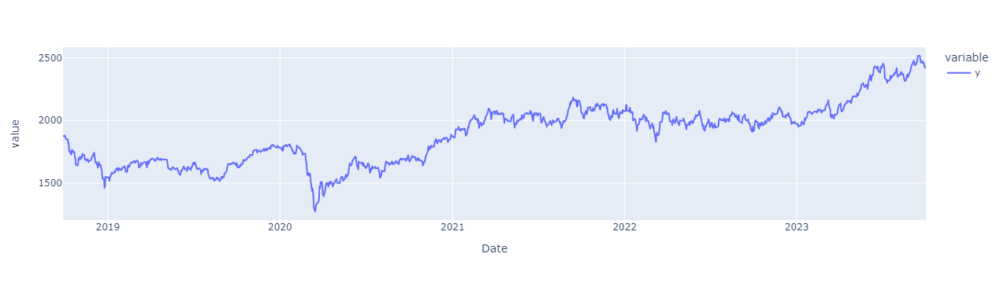

In [5]:
px = yf.download(['1306.T'], start=train_start).xs('Adj Close', axis=1).to_frame('y')
px = px.resample(freq).last().ffill()
px.plot(backend='plotly')

There are multiple reasons:

* Economics stability: 
  * Japan's status as the most indebted country in the world stems from a combination of factors, including demographic challenges, economic stagnation, and deflationary pressures. The Japanese government has implemented various policies and initiatives, including quantitative easing and fiscal stimulus, to address the debt situation and spur economic growth. 
  * To stimulate lending, growth and inflation, BOJ has pinned short-term interest rates at -0.1% and 10-year yields around zero since 2016, relatively speaking Japan's macro status is more stable vs. US/EU/China and we have an assumption that the most-indebted status and government policy would not change in the next two months (our forecast period), this is important for prediction analysis because we use historical data training to predict future.

* Factor model explanatory power:
  * Barra Japan model has lowest specific risk on 1306.T, vs other regional models on its major index ETF.
  * Specific risk refers to the portion of total risk that is unique to an individual security or asset. It is also known as idiosyncratic risk or unsystematic risk. If a model's explanatory power is insufficient (i.e. factors are unable to explain equity returns/risks), then resulting specific risk would be large.
  * Cross reference of candidate ETFs - 
    | RIC         | Barrid   | Index      |
    |-------------|----------|------------|
    | 1306.T      | DA000368 | TOPIX      |
    | 069500.KS   | DA001517 | KOSPI2     |
    | STX50EEX.DE | DA001928 | STOXX50    |
    | 2800.HK     | DA001974 | HSI        |
    | 0050.TW     | DA109942 | TWSE       |
    | QQQ.OQ      | ETF46    | NASDAQ 100 |
    | SPY.P       | ETF50    | S&P 500    |
    | ISF.L       | ETF66    | FTSE 100   |

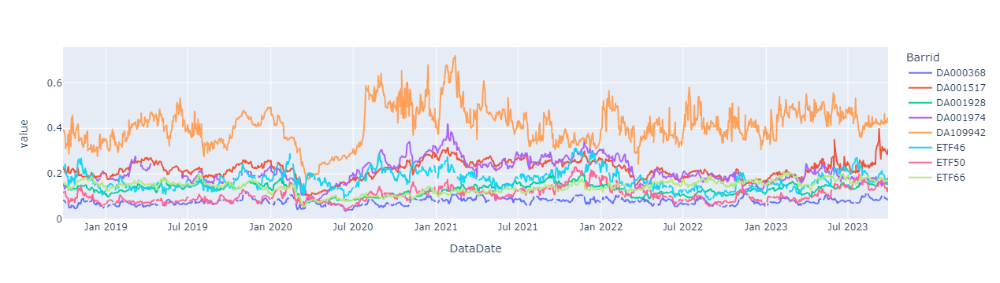

In [6]:
read_csv_kwargs = dict(parse_dates=['DataDate'], usecols=['Barrid', 'DataDate', 'SpecRiskPerc', 'TotalRiskPerc'])

spec_risk = pd.concat([
    pd.read_csv('barra/APACEFMTRD.ETF_Asset_Data.csv', **read_csv_kwargs),
    pd.read_csv('barra/EFMUSATRD.ETF_Asset_Data.csv', **read_csv_kwargs),
    pd.read_csv('barra/EUREFMTRD.ETF_Asset_Data.csv', **read_csv_kwargs),
    pd.read_csv('barra/JPNEFMTRD.ETF_Asset_Data.csv', **read_csv_kwargs)
])
spec_risk['spec_to_total_risk'] = spec_risk.SpecRiskPerc / spec_risk.TotalRiskPerc

spec_risk.pivot_table(index='DataDate', columns='Barrid', values='spec_to_total_risk').plot(backend='plotly')

  * JPNEFMTRD Factors IR： MSCI Japan Equity Factor Trading model has more high-IR factors vs. other market models, below comes from Barra's empirical notes.
  
  ![](barra/style_factor_summary.png)
  ![](barra/style_factor_summary2.png)

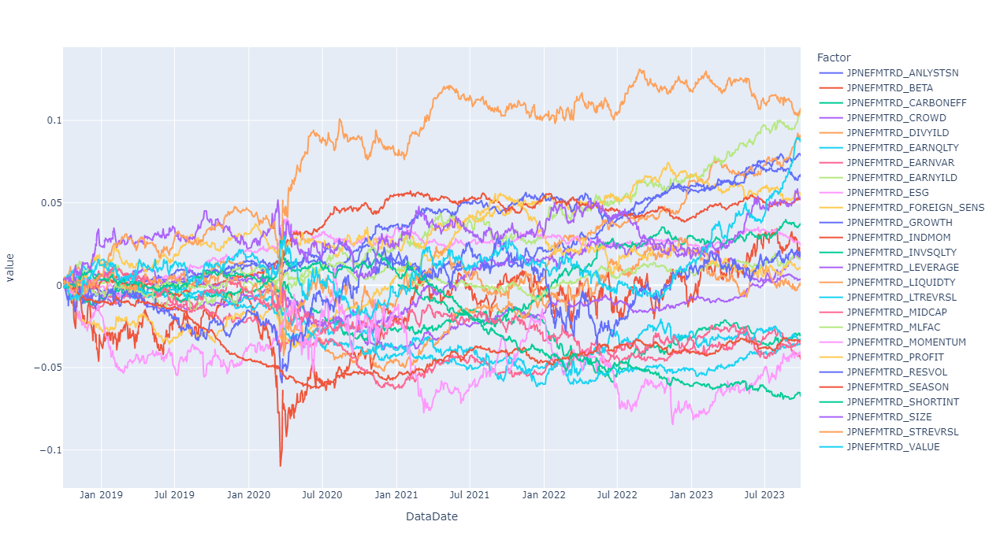

In [7]:
fac_ret = pd.read_csv('barra/JPNEFMTRD.DlyFacRet.csv', parse_dates=['DataDate']).pivot_table(index='DataDate',
                                                                                             columns='Factor',
                                                                                             values='DlyReturn')
fac_ret.cumsum().plot(backend='plotly', height=700)

## 2. Research and Rational

### 2.1 Multi-factor model

The rate of return in a general multifactor model is given by:

$$ r_{1306.T} = x_1r_1 + x_2r_2 + ... + x_{size}r_{value} + x_{value}r_{value} + ... + \epsilon $$
where:

* $r_{1306.T}$ is the asset/ETF return we are trying to forecast
* $x_j$ is the exposure of 1306.T to factor j
* $r_j$ is the return on factor j
* $\epsilon$ is the idiosyncratic error term

To conceptualize a potential price prediction signal for this ETF, we consider the style factors for time series forecast, and use 1306.T's factor loading (i.e. feature) to forecast 1306.T movements in the next two months.

### 2.2 Predictive power? 

The Information Ratio (IR) is a measure of factor returns compared to the volatility. It is used to evaluate the skill of a factor at generating returns in excess of a given benchmark. A higher IR result implies a better factor who’s achieving a higher return in excess of the benchmark, given the risk taken. 

It’s important to note that multifactor models are not the only approach to forecasting stock returns, and their effectiveness may vary depending on the asset or period being analyzed, listed factors IRs are also limited vs practical trading signal, while given the restriction of available data, we do our best on them. The Factors covered involves technical analysis, fundamental analysis, and unconventional sources.

In [8]:
(fac_ret.mean() / fac_ret.std()).sort_values(ascending=False, key=abs).to_frame('IR') * 260 ** .5

,IR
Factor,
JPNEFMTRD_ANLYSTSN,1.363324
JPNEFMTRD_GROWTH,1.071766
JPNEFMTRD_DIVYILD,1.068118
JPNEFMTRD_SHORTINT,-1.033001
JPNEFMTRD_EARNYILD,1.023337
JPNEFMTRD_INDMOM,0.998899
JPNEFMTRD_SEASON,-0.734951
JPNEFMTRD_STREVRSL,0.721463
JPNEFMTRD_VALUE,0.718377


**Technical factors**: past market data, primarily price and volume, could identify patterns and trends that could indicate future price movements., following technical factors may identify potential signals:
* JPNEFMTRD_INDMOM (industry momentum)
* JPNEFMTRD_SEASON (seasonality)
* JPNEFMTRD_STREVRSL (short-term reversal)

**Fundamental factors**: the underlying economic and financial factors that could impact the ETF’s price, below metrics may evaluate the ETF’s intrinsic value and compare it with its current market price: 
* JPNEFMTRD_GROWTH (growth)
* JPNEFMTRD_DIVYILD (dividend yield)
* JPNEFMTRD_EARNYILD (earnings yield)

**Unconventional factors**: non-traditional data sources or patterns that could provide insights into future price movements. For example - 
* JPNEFMTRD_ANLYSTSN (analyst sentiment)
* JPNEFMTRD_SHORTINT (short interest)
* JPNEFMTRD_FOREIGN_SENS (foreign sensitivity)

## 3. Data-driven insights to support the idea

In this practice, we use Prophet to model ETF price and try to forecast its future movements with additional Barra factors. 

Prophet and DeepAR are both popular time series forecasting libraries in Python. Prophet is an open-source library developed by Facebook and designed for automatic forecasting of univariate time series data. It is easy to use and designed to automatically find a good set of hyperparameters for the model in an effort to make skillful forecasts for data with trends and seasonal structure by default. On the other hand, DeepAR is a deep learning-based forecasting algorithm that uses recurrent neural networks (RNNs) to model time series data.

This project focus on data and ideas instead of complex model, Prophet has several advantages over DeepAR vs. previous project. 
* First, it is easier to use than DeepAR, as it requires less expertise in deep learning and neural networks, . 
* Second, it is faster than DeepAR, especially when dealing with small datasets. 
* Third, it provides more flexibility in terms of modeling seasonality and trends 
* Finally, Prophet provides built-in support for modeling holidays and other special events that can affect time series data.

### 3.1 Prepare data

**Features**

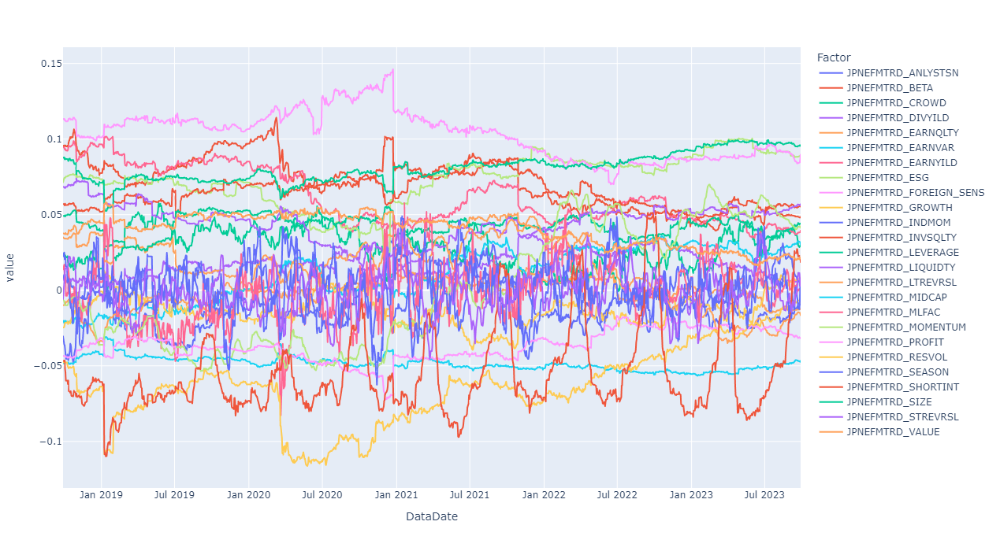

In [9]:
fac_load = pd.read_csv('barra/JPNEFMTRD.ETF_Asset_Exposure.csv', index_col='DataDate', parse_dates=True)

# this factor was introduced in Jan 2021, it does not have enough history for training
fac_load = fac_load[fac_load.Factor != 'JPNEFMTRD_CARBONEFF']

fac_load = fac_load.pivot_table(index='DataDate', columns='Factor', values='Exposure').resample(freq).ffill()
fac_load.plot(backend='plotly', height=700)

**Time series split into train and validation sets**

We are going to do a 2-month forecast, therefore we shift the features by the 42-bday window. 

In [10]:
all_ = fac_load.reindex(pd.bdate_range(train_start, test_start + BDay(forecast_periods))).shift(
    forecast_periods).dropna().join(px)
train = all_.loc[:valid_start].reset_index()
valid = all_.loc[valid_start:].reset_index()

### 3.2 Prophet model

We fit the model by instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. Then you call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.

In [11]:
# Fit model
m = Prophet()
for f in fac_load.columns:
    m.add_regressor(f)
m.fit(train.rename(columns={'index': 'ds'}).dropna())

19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing


### 3.3 Preliminary testing

Predictions are then made on a dataframe with a column ds containing the dates for which a prediction is to be made. The predict method will assign each row in future a predicted value which it names yhat. If we pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [12]:
future = all_.reset_index().rename(columns={'index': 'ds'})
forecast = m.predict(future)

Plot the forecast by calling the Prophet.plot method and passing in your forecast dataframe. Please we add green points stands for validation period (out-of-sample), it actually has a good forecast on the trend.

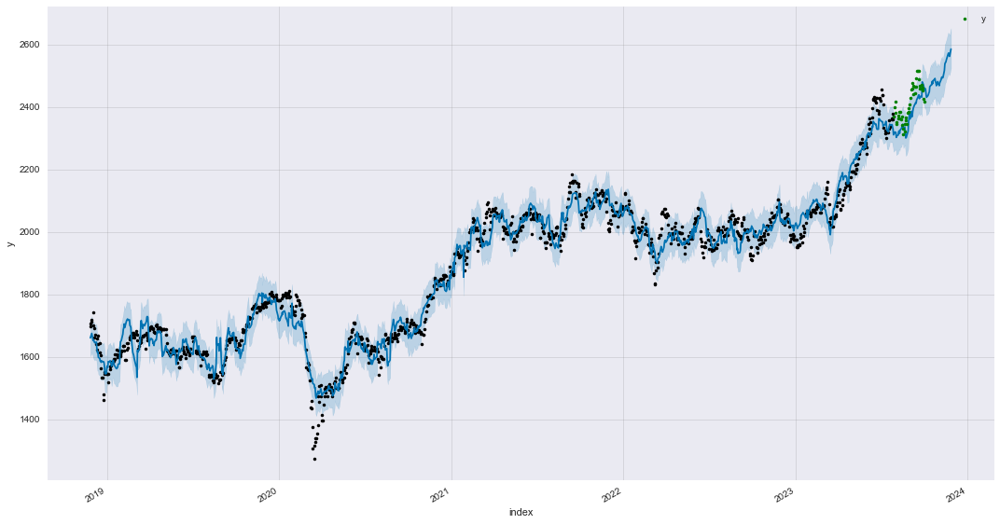

In [13]:
fig1 = m.plot(forecast, figsize=(15, 9))
valid[['index', 'y']].set_index('index').plot(ax=fig1.axes[0], style='.', color='green')

See the forecast components, you can use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series.

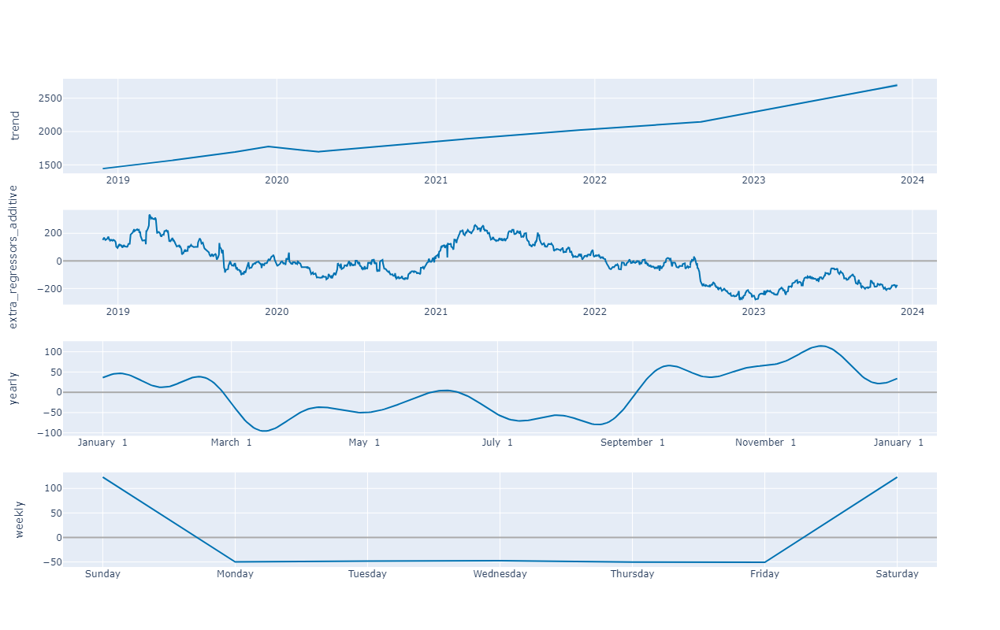

In [14]:
plot_components_plotly(m, forecast)

### 3.4 Cross Validation

In [15]:
from prophet.diagnostics import cross_validation

cutoffs = pd.to_datetime(['2023-02-01', '2023-04-01', '2023-06-01'])
df_cv = cross_validation(m, cutoffs=cutoffs, horizon='42 days')

  0%|          | 0/3 [00:00<?, ?it/s]

19:25:00 - cmdstanpy - INFO - Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing
19:25:01 - cmdstanpy - INFO - Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing
19:25:02 - cmdstanpy - INFO - Chain [1] start processing
19:25:02 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
from prophet.diagnostics import performance_metrics

df_p = performance_metrics(df_cv)
df_p.tail()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
33,38 days,30638.181835,175.037658,169.814480,0.076081,0.087792,0.079282,0.0
34,39 days,26967.580375,164.218088,159.510765,0.071613,0.063032,0.074456,0.0
35,40 days,20618.319134,143.590804,140.400730,0.063853,0.057975,0.066089,0.0
36,41 days,17449.570221,132.096821,130.059993,0.059101,0.058594,0.060974,0.0
37,42 days,17202.783117,131.159381,129.139738,0.059090,0.058594,0.060965,0.0


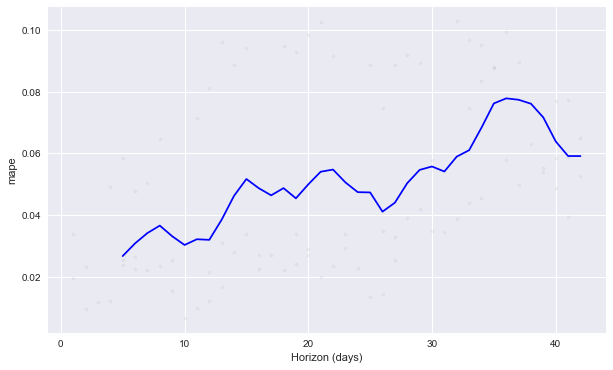

In [17]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='mape')

## 4. Conceptualize price prediction signal

### 4.1 Findings

* **Chart 3.1**: Price forecast purely on market data (price/volume) at daily frequency is difficult, because too many factors could affect stock and the returns looks like white noise for tradional timeseries model most of the time. However, applying Barra multi-factor models to build up features/factors would somewhat decreases the difficulty of timeseries forecast, as we are able to observe some trend and seasonings from the factor loadings (e.g. short interest)

* **Chart 3.3**: The Prophet model is an additive regression model, with three main components: Trend, Seasonality, and other custom regressors.

  $$ F(t) = g(t) + s(t) + h(t) $$

  where 
  
  * **F(t) is forecast at point t**
  * **g(t) is trend factor**: we see the increasing trend for the whole 5 years, technically this might be biased due to the limitation of the selected period, while actually this trend holds for more than 10 years in TOPIX given his relatively static Economic status
  * **s(t) is seasonality component**: weekly is not indicative, while for monthly TOPIX tends to drop in March/December, while climbs from August to October.
  * **h(t) is extra additive regressor component**: this one is not intuitive given we have fed 25 style factors, while it contributes most for daily patterns.

* **Chart 3.4**: The longer the forecast period, the larger uncentainty of the model


### 4.2 Forecast

To do an actual/more accurate forecast for the next two months, we re-train the model with train+validation data, and forecast on test data - 

19:25:07 - cmdstanpy - INFO - Chain [1] start processing
19:25:08 - cmdstanpy - INFO - Chain [1] done processing


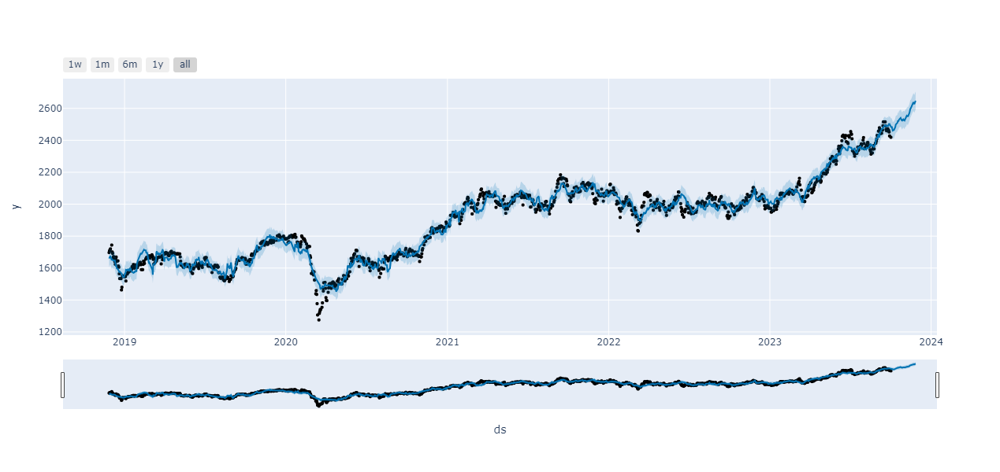

In [18]:
# Fit model
m = Prophet()
for f in fac_load.columns:
    m.add_regressor(f)
m.fit(all_.reset_index().rename(columns={'index': 'ds'}).dropna())

# Forecast
future = all_.reset_index().rename(columns={'index': 'ds'})
forecast = m.predict(future)

# Plotly
plot_plotly(m, forecast)

Our model forecasts 1306.T would reach level 2600 in the next two months.

### 4.3 Limitations and potential improvements

It sounds trivial to forecast TOPIX future movements with above simple Prophet model, but it is worth noted there are assumptions and some level of survivor bias - 

1. **Model selection**: we picked Japan model because we have observed Barra has a better explanation (lower specific risk) on the ETF, this assumes Barra's equity factor model continues to explain the market well.
2. **Factors alpha**: Another reason is Japan's style factors IR is high vs. other markets, this implies these factors are not simply risk factor, they could be informational and used as partial alpha. However, we did not select factors based on historical IR. 
3. **Model evaluation**: We have not well examined validation, mape or other mathematical metrics to evaluate market forecast is usually different from live metrics such as pnl or post-cost Sharpe
4. **Barra limitation**: barra style factor is a good representative of live-world alpha, which it covers all kinds of data source including technicals, fundamentals and other unconventional factors in a robust way; while in practice seldom people would use it as alpha because of its data latency, aggregation level and linearity. 

Below are some potential improvements in practice vs. study:

1. **Forecast horizon**: Instead of using existing data to forecast 2 months, we should build a rolling estimator to update training data up to today, and forecast next period returns, this would guarantee we use latest information.

2. **Evaluation**: while for evaluation, we should also use rolling forecast to compute loss or build a simple backtest to evaluate performance 

3. **Data**: 
  * Technical analysis: instead of using Barra's, we can increase frequency to intraday level;
  * Fundamental analysis: there are better/faster resources to collect fundamental data (e.g. earnings forecast) 
  * Alternative: other unconventional sources like analyst sentiment / news sentiment / short interests, they worth more studies to build custom factors